<a href="https://colab.research.google.com/github/wpqc21/VulNeuralNetworks/blob/main/Random_Walk_TensorFlow_01_26_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
def map_function(x, lower_bound, upper_bound):
   return (x - lower_bound) % (upper_bound - lower_bound)

In [2]:
def force_mov(x, y, dxy, mag):
    x = int(x)
    y = int(y)
    force_xy = dxy[x][y]
    return mag * (force_xy)
    
    

In [3]:
import numpy as np
import pandas as pd
from pylab import *
import plotly.graph_objects as go
import plotly.express as px
import random
from random import randint
import matplotlib.pyplot as plt
import pylab
import math
import statistics

np.set_printoptions(threshold=np.inf)

In [4]:
%matplotlib inline
import noise
import numpy as np
import matplotlib
from mpl_toolkits.mplot3d import axes3d

#### 03/30/2022

# Random Walks

# Symmetric Bowl Random Walk

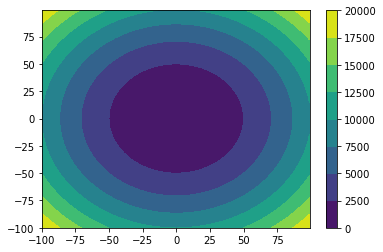

In [5]:
x = np.arange(-100,100,1)
y = np.arange(-100,100,1)

X, Y = np.meshgrid(x, y)

Z = X*X + Y*Y

cp = plt.contourf(X, Y, Z)
cb = plt.colorbar(cp)

In [6]:
# lin_x = np.linspace(0,1,shape[0],endpoint=False)
# lin_y = np.linspace(0,1,shape[1],endpoint=False)
# x,y = np.meshgrid(lin_x,lin_y)

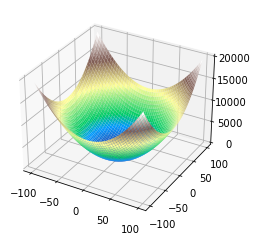

In [8]:
fig = matplotlib.pyplot.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(X,Y,Z,cmap='terrain')

terrain_cmap = matplotlib.cm.get_cmap('terrain')
def matplotlib_to_plotly(cmap, pl_entries):
    h = 1.0/(pl_entries-1)
    pl_colorscale = []

    for k in range(pl_entries):
        C = list(map(np.uint8, np.array(cmap(k*h)[:3])*255))
        pl_colorscale.append([k*h, 'rgb'+str((C[0], C[1], C[2]))])

    return pl_colorscale

terrain = matplotlib_to_plotly(terrain_cmap, 255)

# import plotly
# import plotly.graph_objects as go

# fig = go.Figure(data=[go.Surface(colorscale=terrain,z=Z)])

# fig.update_layout(title='Symmetric Bowl')

# fig.show()

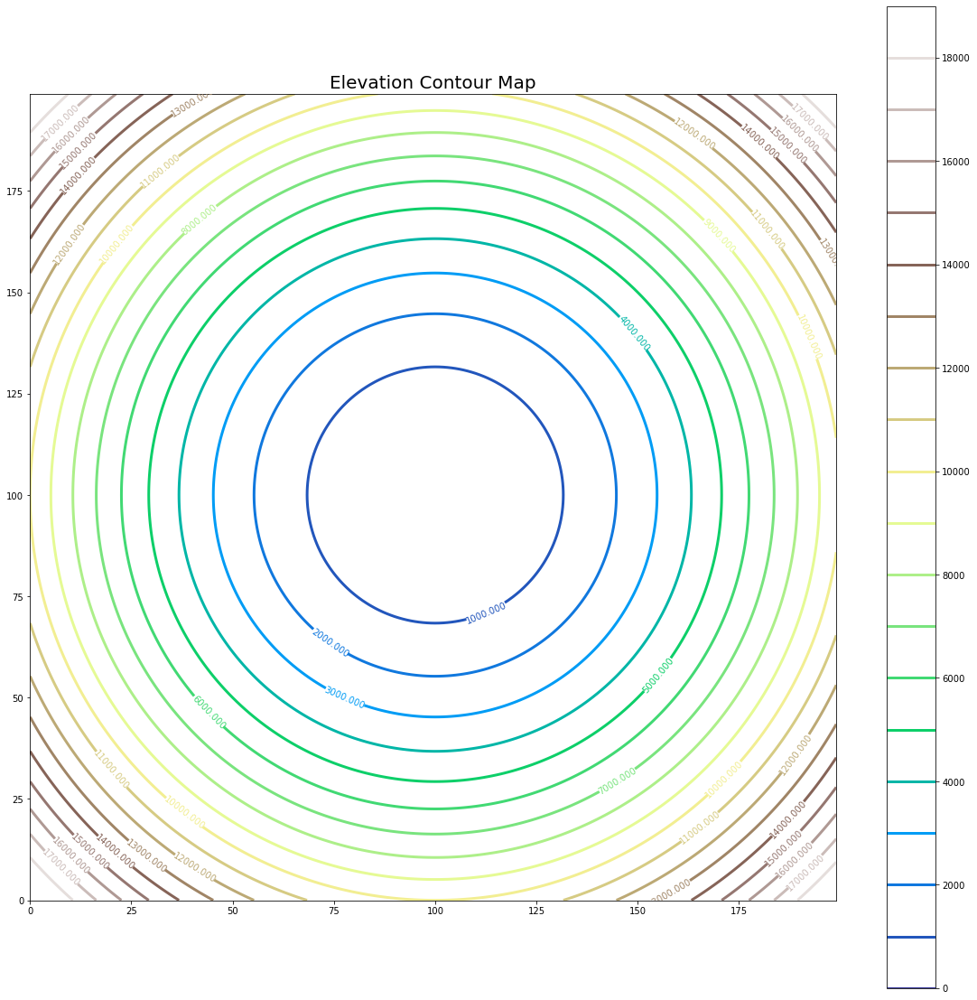

In [9]:
#Find Min, Max, Divide Absolute Value of Sum by 20

a = round(Z.min())

b = round(Z.max())

c = round((abs(Z.min()) + abs(Z.max())) / 20)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3)
ax.clabel(ecm, fontsize=10)

plt.title("Elevation Contour Map", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

## 8 Walkers, 10 Steps, 100 Steps, 1000 Steps, 10,000 Steps, Magnitude = 0.0

In [10]:
avg_2d_bowl = []

(0.0, 199.0)
(0.0, 199.0)


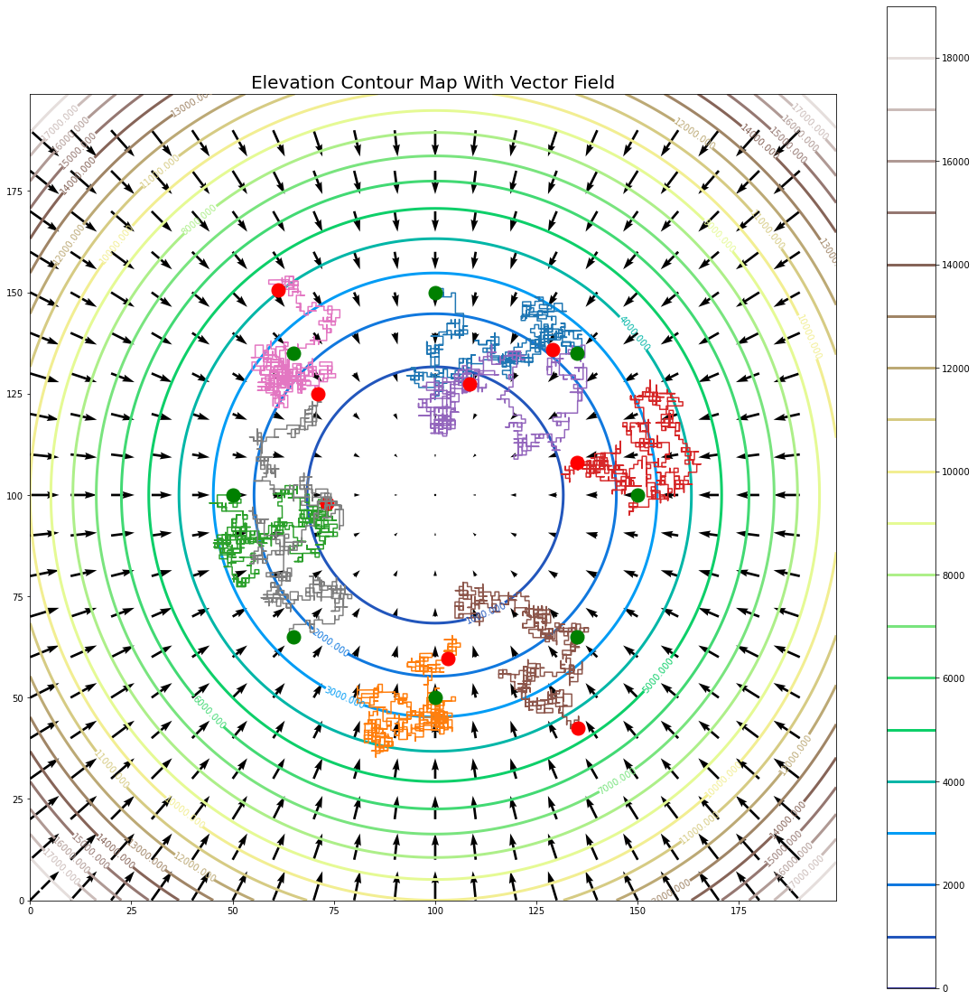

In [11]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


x = np.arange(0,200,1)
y = np.arange(0,200,1)

X, Y = np.meshgrid(x, y)

# widths = np.linspace(0, 2, int(X.size / 50))

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')


ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3)
ax.clabel(ecm, fontsize=10)

step=10

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

# ax.quiver(X, Y, dy, dx)

ax.set_aspect('equal')

print(plt.xlim())
print(plt.ylim())

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 199
N = 1000
W = 8

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
origins = []
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 100
        y[0] = 150
    elif walker == 1:
        x[0] = 100
        y[0] = 50
    elif walker == 2:
        x[0] = 50
        y[0] = 100
    elif walker == 3:
        x[0] = 150
        y[0] = 100
    elif walker == 4:
        x[0] = 135
        y[0] = 135
    elif walker == 5:
        x[0] = 135
        y[0] = 65
    elif walker == 6:
        x[0] = 65
        y[0] = 135
    else:
        x[0] = 65
        y[0] = 65
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
        
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 

plt.show()

In [12]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))
avg_2d_bowl.append(mean(list_dist))

The max distance is:  60.19424118402002 
The minimum distance is:  10.141460920400533 
The median distance is:  22.86314281266506
The average distance is:  26.118306338280885


In [13]:
list_dist

[32.34846129818231,
 10.141460920400533,
 23.28487228481135,
 17.007693101652674,
 27.507056864012583,
 22.441413340518768,
 16.021251712648837,
 60.19424118402002]

## 8 Walkers, 1000 Steps, 0.001 Magnitude

(0.0, 199.0)
(0.0, 199.0)


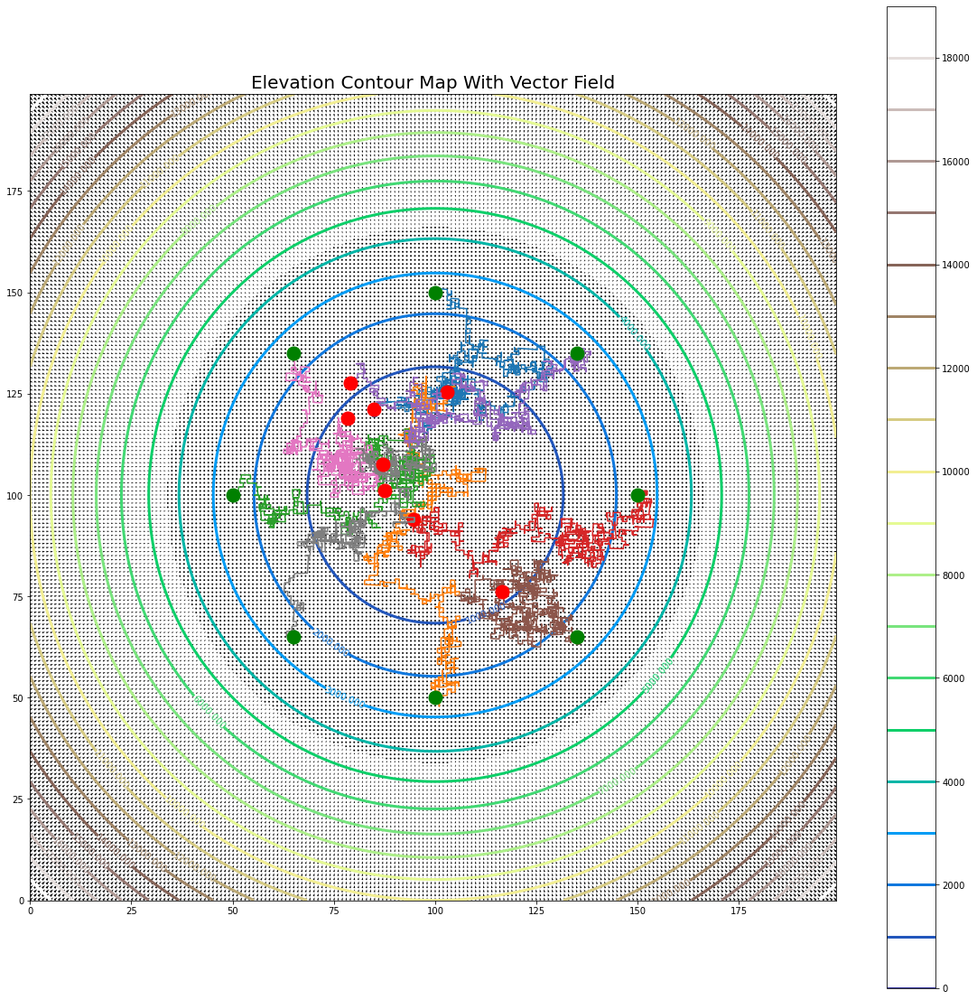

In [14]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


x = np.arange(0,200,1)
y = np.arange(0,200,1)

X, Y = np.meshgrid(x, y)

# widths = np.linspace(0, 2, int(X.size / 50))

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')


ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3)
ax.clabel(ecm, fontsize=10)

# step=10

# ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

ax.quiver(X, Y, dy, dx)

ax.set_aspect('equal')

print(plt.xlim())
print(plt.ylim())

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 199
N = 1000
W = 8

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
origins = []
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 100
        y[0] = 150
    elif walker == 1:
        x[0] = 100
        y[0] = 50
    elif walker == 2:
        x[0] = 50
        y[0] = 100
    elif walker == 3:
        x[0] = 150
        y[0] = 100
    elif walker == 4:
        x[0] = 135
        y[0] = 135
    elif walker == 5:
        x[0] = 135
        y[0] = 65
    elif walker == 6:
        x[0] = 65
        y[0] = 135
    else:
        x[0] = 65
        y[0] = 65
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
        
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 

plt.show()

In [15]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))
avg_2d_bowl.append(mean(list_dist))

The max distance is:  75.41870338317926 
The minimum distance is:  20.889444798750443 
The median distance is:  42.80519886014075
The average distance is:  43.56602532668661


## 8 Walkers, 1000 Steps, Magnitude = 0.01

(0.0, 199.0)
(0.0, 199.0)


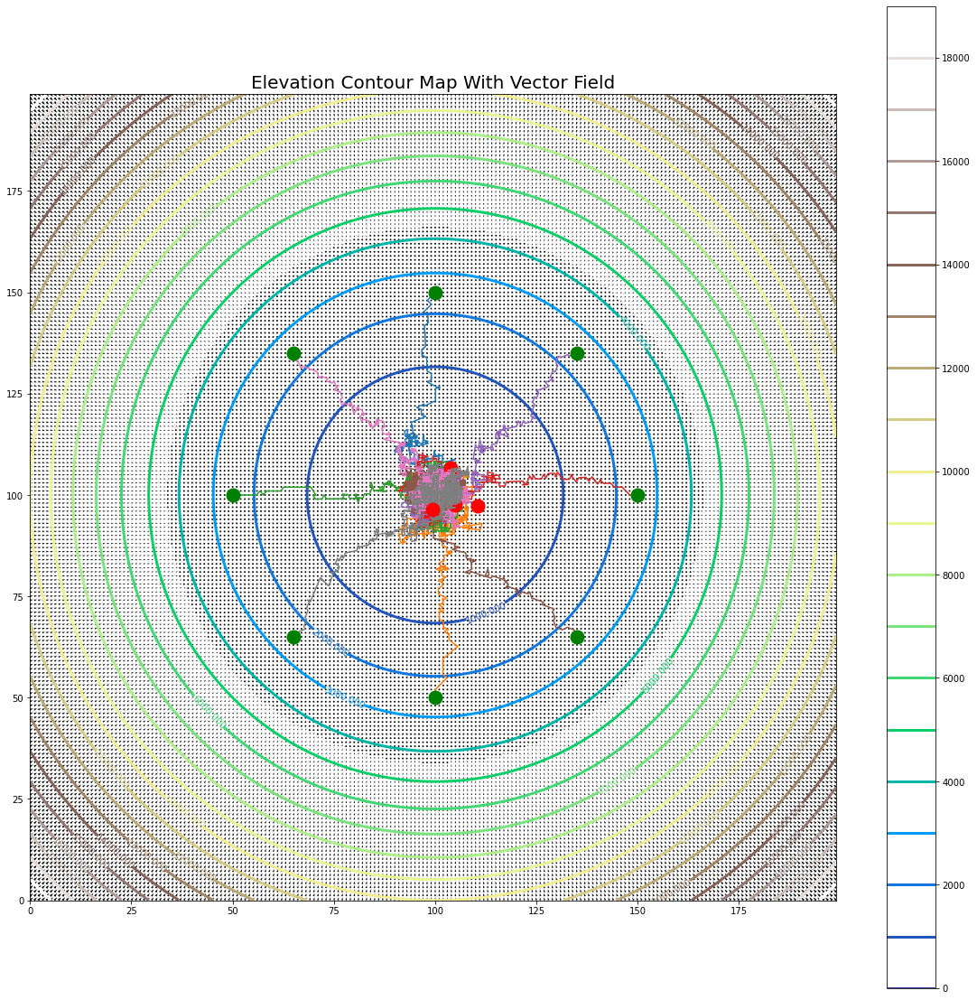

In [16]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


x = np.arange(0,200,1)
y = np.arange(0,200,1)

X, Y = np.meshgrid(x, y)

# widths = np.linspace(0, 2, int(X.size / 50))

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')


ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3)
ax.clabel(ecm, fontsize=10)

# step=10

# ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

ax.quiver(X, Y, dy, dx)

ax.set_aspect('equal')

print(plt.xlim())
print(plt.ylim())

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 199
N = 1000
W = 8

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
origins = []
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 100
        y[0] = 150
    elif walker == 1:
        x[0] = 100
        y[0] = 50
    elif walker == 2:
        x[0] = 50
        y[0] = 100
    elif walker == 3:
        x[0] = 150
        y[0] = 100
    elif walker == 4:
        x[0] = 135
        y[0] = 135
    elif walker == 5:
        x[0] = 135
        y[0] = 65
    elif walker == 6:
        x[0] = 65
        y[0] = 135
    else:
        x[0] = 65
        y[0] = 65
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
        
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 

plt.show()

In [17]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_bowl.append(mean(list_dist))

The max distance is:  54.72898318076096 
The minimum distance is:  44.91565873946395 
The median distance is:  51.37293055378049
The average distance is:  50.63752128639695


## 8 Walkers, 1000 Steps, Magnitude = 0.1

(0.0, 199.0)
(0.0, 199.0)


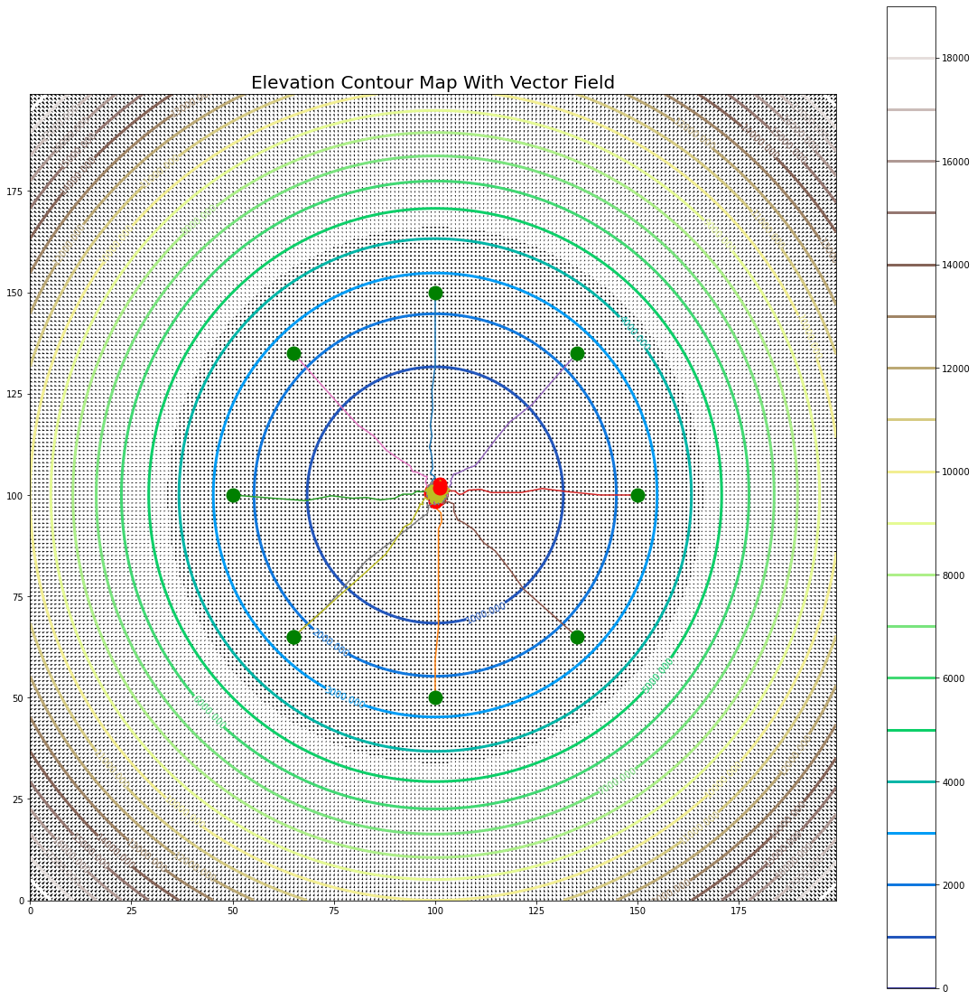

In [18]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


x = np.arange(0,200,1)
y = np.arange(0,200,1)

X, Y = np.meshgrid(x, y)

# widths = np.linspace(0, 2, int(X.size / 50))

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')


ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3)
ax.clabel(ecm, fontsize=10)

# step=10

# ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

ax.quiver(X, Y, dy, dx)

ax.set_aspect('equal')

print(plt.xlim())
print(plt.ylim())

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 199
N = 1000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 100
        y[0] = 150
    elif walker == 1:
        x[0] = 100
        y[0] = 50
    elif walker == 2:
        x[0] = 50
        y[0] = 100
    elif walker == 3:
        x[0] = 150
        y[0] = 100
    elif walker == 4:
        x[0] = 135
        y[0] = 135
    elif walker == 5:
        x[0] = 135
        y[0] = 65
    elif walker == 6:
        x[0] = 65
        y[0] = 135
    else:
        x[0] = 65
        y[0] = 65
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dx, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dy, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
        
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 

plt.show()

In [19]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_bowl.append(mean(list_dist))

The max distance is:  52.193869371794946 
The minimum distance is:  47.23812019968585 
The median distance is:  50.8062988220948
The average distance is:  49.92438041408106


In [20]:
magnitudes1 = [0.0001, 0.001, 0.01, 0.1]

mag_plot1 = [str(i) for i in magnitudes1]
# magnitudes = [str(i) for i in magnitudes]

print(avg_2d_bowl, "\n", magnitudes1)

fig1 = px.line(x = mag_plot1, y = avg_2d_bowl)
fig1.show()

[26.118306338280885, 43.56602532668661, 50.63752128639695, 49.92438041408106] 
 [0.0001, 0.001, 0.01, 0.1]


In [21]:
d_x_log = np.log10(magnitudes1)
d_y_log = np.log10(avg_2d_bowl)

In [22]:
fig7 = px.scatter(x = d_x_log, y = d_y_log, trendline="ols")
fig7.data[1].line.color = 'red'
fig7.show()

In [23]:
# def wrap(v, N):

#     if v > N/2:
#         return v - N, True
#     elif v < -N/2:
#         return v + N, True
#     return v, False

In [24]:
# def map_function(x, lower_bound, upper_bound):
#    return (x - lower_bound) % (upper_bound - lower_bound)

In [25]:
# def force(xy, dxy):
#             return (-(((xy + dxy) * (xy + dxy)) - (xy * xy) / dxy))
            

In [56]:
# Scale 2x the Shape
shape = (2000,2000)
scale = 4000.0
octaves = 6
persistence = 0.5
lacunarity = 2.0
seed = random.randint(0, 100)

In [57]:
world = np.zeros(shape)
for i in range(shape[0]):
    for j in range(shape[1]):
        world[i][j] = noise.pnoise2(i/scale, 
                                    j/scale, 
                                    octaves=octaves, 
                                    persistence=persistence, 
                                    lacunarity=lacunarity, 
                                    repeatx=1024, 
                                    repeaty=1024, 
                                    base=seed)

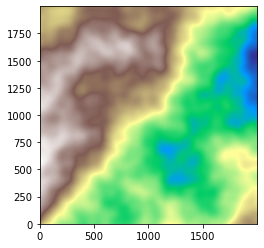

In [58]:
matplotlib.pyplot.imshow(world,cmap='terrain', origin='lower')

In [59]:
# Multiply by 1000 in order to scale correctly
world = world*1000

In [60]:
lin_x = np.linspace(0,1,shape[0],endpoint=False)
lin_y = np.linspace(0,1,shape[1],endpoint=False)
x,y = np.meshgrid(lin_x,lin_y)

#Elevation/Height = Z
Z = world

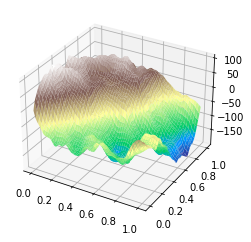

In [61]:
fig = matplotlib.pyplot.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(x,y,Z,cmap='terrain')

terrain_cmap = matplotlib.cm.get_cmap('terrain')
def matplotlib_to_plotly(cmap, pl_entries):
    h = 1.0/(pl_entries-1)
    pl_colorscale = []

    for k in range(pl_entries):
        C = list(map(np.uint8, np.array(cmap(k*h)[:3])*255))
        pl_colorscale.append([k*h, 'rgb'+str((C[0], C[1], C[2]))])

    return pl_colorscale

terrain = matplotlib_to_plotly(terrain_cmap, 255)

# import plotly
# import plotly.graph_objects as go

# fig = go.Figure(data=[go.Surface(colorscale=terrain,z=Z)])

# fig.update_layout(title='Random 3D Terrain')

# fig.show()

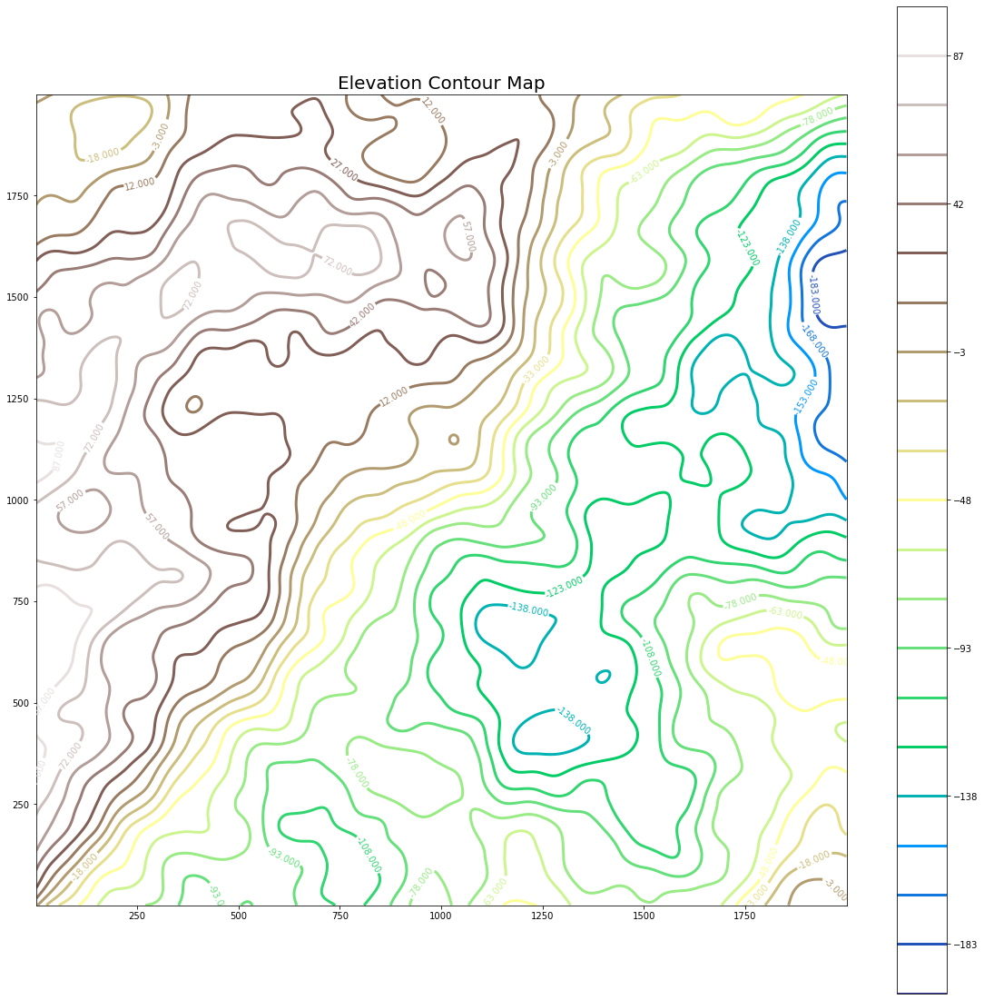

In [62]:
#Find Min, Max, Divide Absolute Value of Sum by 20

a = round(Z.min())

b = round(Z.max())

c = round((abs(Z.min()) + abs(Z.max())) / 20)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)
ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3,  origin='lower')
ax.clabel(ecm, fontsize=10)
plt.title("Elevation Contour Map", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

In [63]:
avg_2d_land = []

## 9 Walkers, 10000 Steps, Magnitude = 0.0001, 0.001, 0.01, 0.1

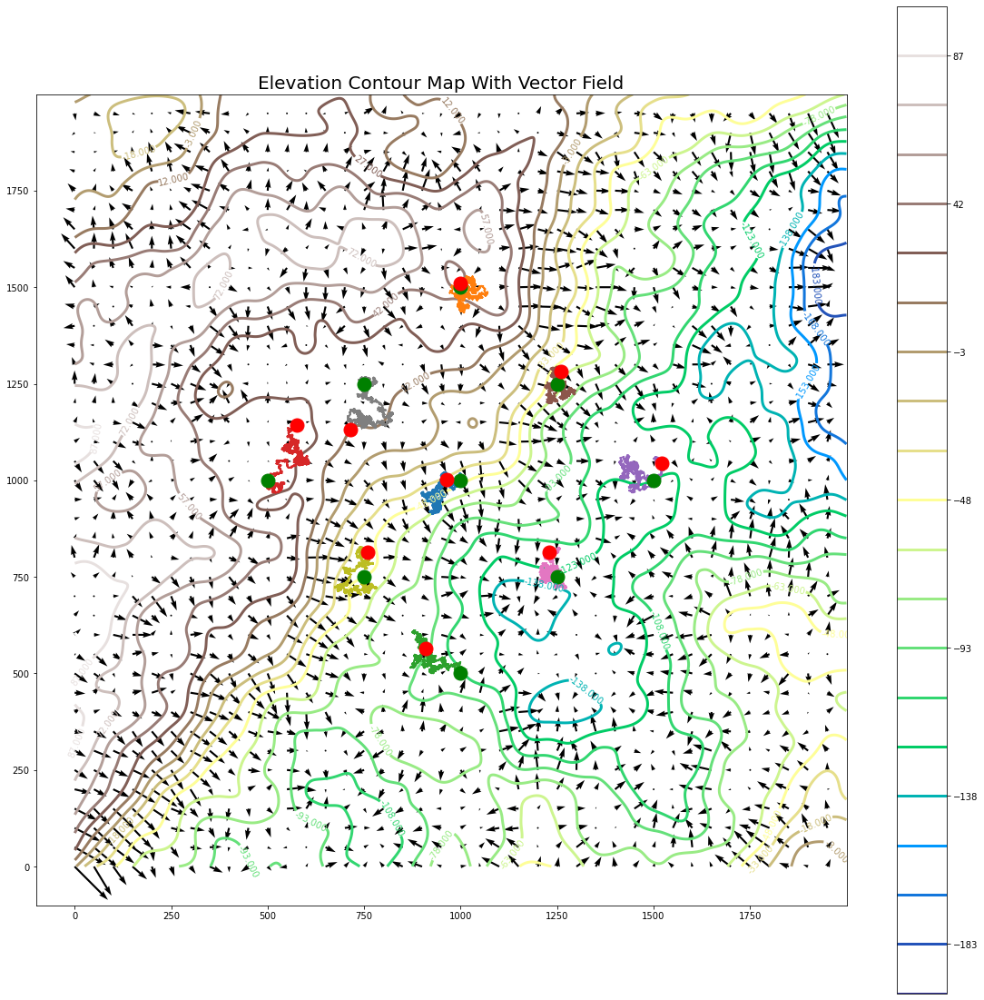

In [64]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

# ax.quiver(X, Y, dy, dx)

# ax.set_aspect('equal')

# print(plt.xlim())
# print(plt.ylim())

# ax.set_aspect('equal')

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 1000
        y[0] = 1000
    elif walker == 1:
        x[0] = 1000
        y[0] = 1500
    elif walker == 2:
        x[0] = 1000
        y[0] = 500
    elif walker == 3:
        x[0] = 500
        y[0] = 1000
    elif walker == 4:
        x[0] = 1500
        y[0] = 1000
    elif walker == 5:
        x[0] = 1250
        y[0] = 1250
    elif walker == 6:
        x[0] = 1250
        y[0] = 750
    elif walker == 7:
        x[0] = 750
        y[0] = 1250
    else:
        x[0] = 750
        y[0] = 750
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
    
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 
        
#     list_points.append((x[-1], y[-1]))
#     all_walks1.append((x, y))
#     plt.plot(x,y)
#     plt.plot(x[0], y[0], 'go', markersize=15)
#     plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.show()

In [65]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_land.append(mean(list_dist))

The max distance is:  160.68240925383992 
The minimum distance is:  9.904066425189258 
The median distance is:  63.34395007318227
The average distance is:  72.83427355200494


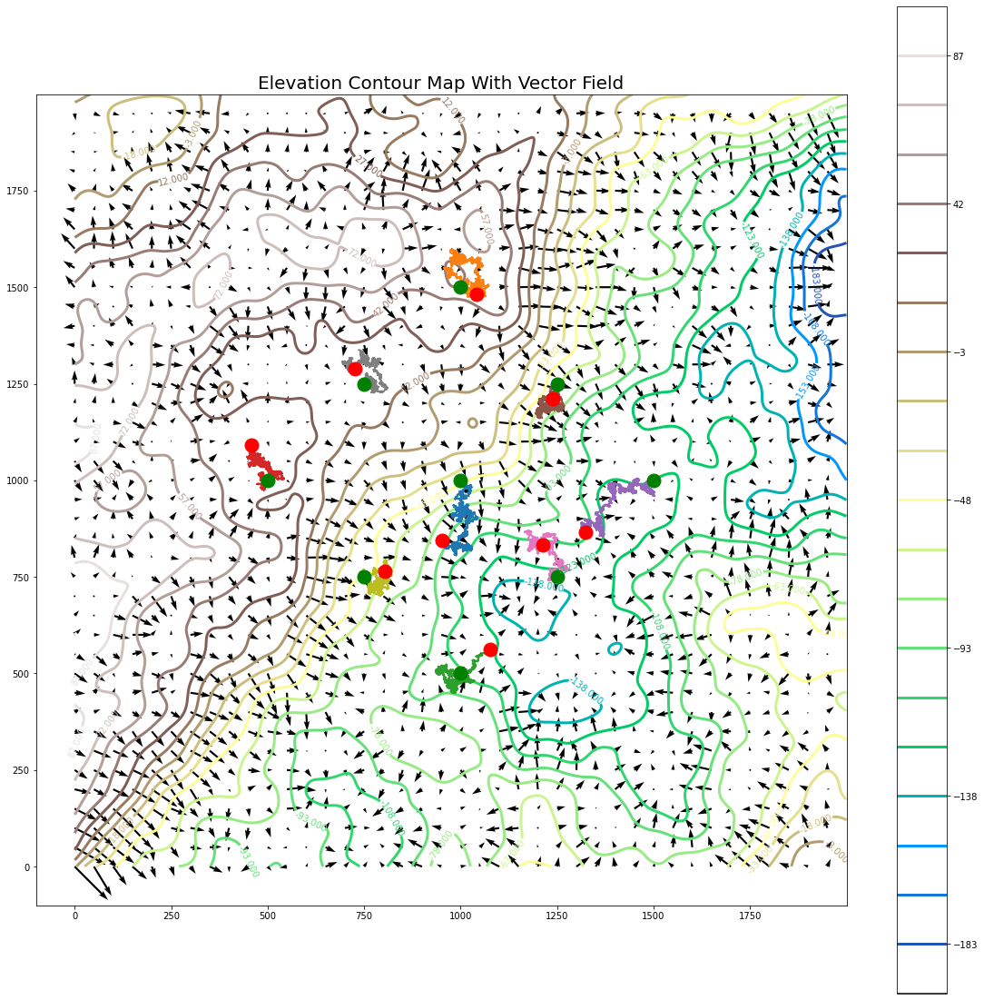

In [66]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

# ax.quiver(X, Y, dy, dx)

# ax.set_aspect('equal')

# print(plt.xlim())
# print(plt.ylim())

# ax.set_aspect('equal')

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 1000
        y[0] = 1000
    elif walker == 1:
        x[0] = 1000
        y[0] = 1500
    elif walker == 2:
        x[0] = 1000
        y[0] = 500
    elif walker == 3:
        x[0] = 500
        y[0] = 1000
    elif walker == 4:
        x[0] = 1500
        y[0] = 1000
    elif walker == 5:
        x[0] = 1250
        y[0] = 1250
    elif walker == 6:
        x[0] = 1250
        y[0] = 750
    elif walker == 7:
        x[0] = 750
        y[0] = 1250
    else:
        x[0] = 750
        y[0] = 750
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.001)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.001)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
    
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 
        
#     list_points.append((x[-1], y[-1]))
#     all_walks1.append((x, y))
#     plt.plot(x,y)
#     plt.plot(x[0], y[0], 'go', markersize=15)
#     plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.show()

In [67]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_land.append(mean(list_dist))

The max distance is:  221.04310663247566 
The minimum distance is:  39.78330685956797 
The median distance is:  91.6273247433179
The average distance is:  95.76507445212052


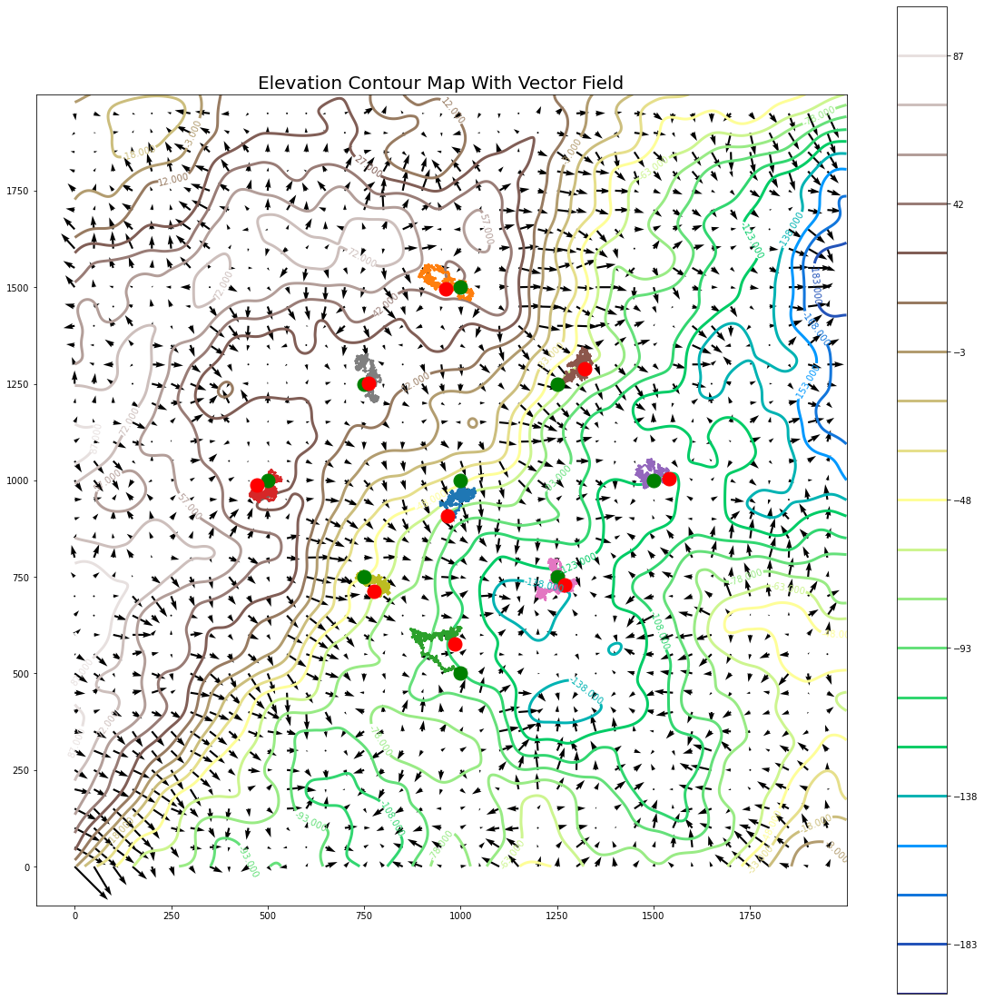

In [68]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

# ax.quiver(X, Y, dy, dx)

# ax.set_aspect('equal')

# print(plt.xlim())
# print(plt.ylim())

# ax.set_aspect('equal')

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 1000
        y[0] = 1000
    elif walker == 1:
        x[0] = 1000
        y[0] = 1500
    elif walker == 2:
        x[0] = 1000
        y[0] = 500
    elif walker == 3:
        x[0] = 500
        y[0] = 1000
    elif walker == 4:
        x[0] = 1500
        y[0] = 1000
    elif walker == 5:
        x[0] = 1250
        y[0] = 1250
    elif walker == 6:
        x[0] = 1250
        y[0] = 750
    elif walker == 7:
        x[0] = 750
        y[0] = 1250
    else:
        x[0] = 750
        y[0] = 750
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.01)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.01)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
    
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 
        
#     list_points.append((x[-1], y[-1]))
#     all_walks1.append((x, y))
#     plt.plot(x,y)
#     plt.plot(x[0], y[0], 'go', markersize=15)
#     plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.show()

In [69]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_land.append(mean(list_dist))

The max distance is:  98.92745001710882 
The minimum distance is:  10.84417805107723 
The median distance is:  39.86467626808621
The average distance is:  49.81130288548718


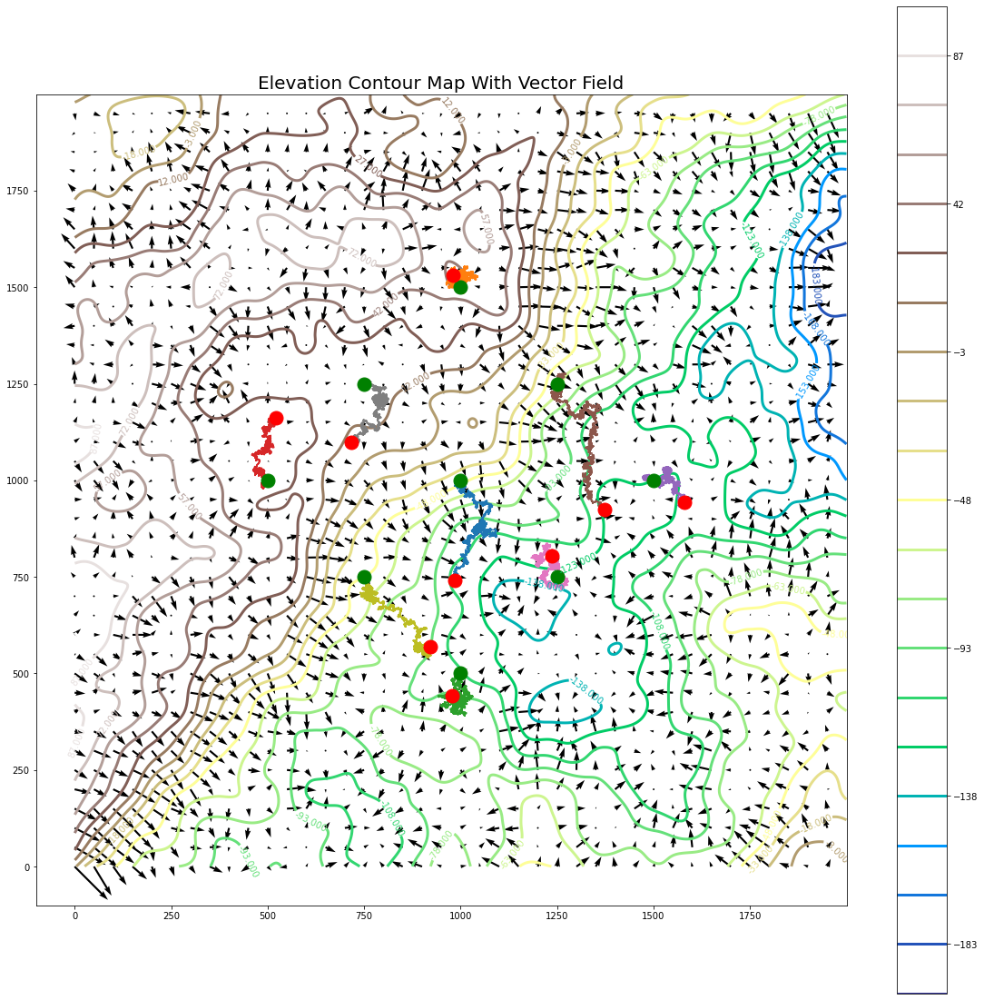

In [70]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

# ax.quiver(X, Y, dy, dx)

# ax.set_aspect('equal')

# print(plt.xlim())
# print(plt.ylim())

# ax.set_aspect('equal')

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 1000
        y[0] = 1000
    elif walker == 1:
        x[0] = 1000
        y[0] = 1500
    elif walker == 2:
        x[0] = 1000
        y[0] = 500
    elif walker == 3:
        x[0] = 500
        y[0] = 1000
    elif walker == 4:
        x[0] = 1500
        y[0] = 1000
    elif walker == 5:
        x[0] = 1250
        y[0] = 1250
    elif walker == 6:
        x[0] = 1250
        y[0] = 750
    elif walker == 7:
        x[0] = 750
        y[0] = 1250
    else:
        x[0] = 750
        y[0] = 750
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
    
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 
        
#     list_points.append((x[-1], y[-1]))
#     all_walks1.append((x, y))
#     plt.plot(x,y)
#     plt.plot(x[0], y[0], 'go', markersize=15)
#     plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.show()

In [71]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_land.append(mean(list_dist))

The max distance is:  348.06048065531934 
The minimum distance is:  36.53708574722653 
The median distance is:  154.59892803090335
The average distance is:  158.50773418783655


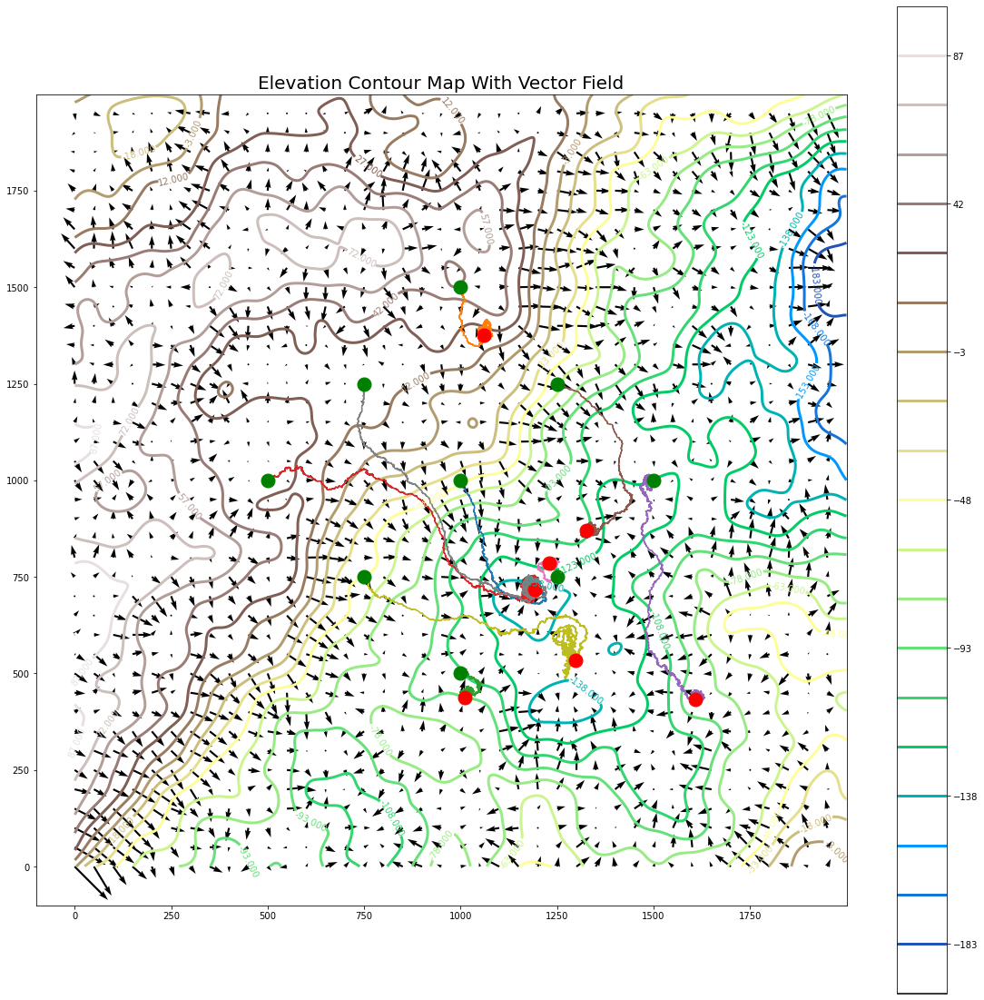

In [72]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

# ax.quiver(X, Y, dy, dx)

# ax.set_aspect('equal')

# print(plt.xlim())
# print(plt.ylim())

# ax.set_aspect('equal')

plt.title("Elevation Contour Map With Vector Field", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = []
list_points = []
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

# fig, ax = plt.subplots(figsize=(20,20), facecolor='white')

for walker in range(W):
    if walker == 0:
        x[0] = 1000
        y[0] = 1000
    elif walker == 1:
        x[0] = 1000
        y[0] = 1500
    elif walker == 2:
        x[0] = 1000
        y[0] = 500
    elif walker == 3:
        x[0] = 500
        y[0] = 1000
    elif walker == 4:
        x[0] = 1500
        y[0] = 1000
    elif walker == 5:
        x[0] = 1250
        y[0] = 1250
    elif walker == 6:
        x[0] = 1250
        y[0] = 750
    elif walker == 7:
        x[0] = 750
        y[0] = 1250
    else:
        x[0] = 750
        y[0] = 750
    for i in range(1, N):
        rand = randint(0, 3)
        if rand == 0:
            x[i] = x[i - 1] + 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 2)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 2)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 1:
            x[i] = x[i - 1] - 1
            y[i] = y[i - 1]
            x[i] = x[i] + force_mov(x[i], y[i], dy, 2)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 2)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        elif rand == 2:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] + 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 2)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 2)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

        else:
            x[i] = x[i - 1] 
            y[i] = y[i - 1] - 1
            x[i] = x[i] + force_mov(x[i], y[i], dy, 2)
            y[i] = y[i] + force_mov(x[i], y[i], dx, 2)
#             print(i, x[i], y[i], dx[int(x[i])][int(y[i])], dy[int(x[i])][int(y[i])])

#     x_wraps = np.where(np.diff((x + A/2) // A))[0]
#     y_wraps = np.where(np.diff((y + A/2) // A))[0]
    
#     for i in x_wraps:
#         x[i] = np.nan
    
#     for i in y_wraps:
#         y[i] = np.nan
    
    list_origins.append((x[0], y[0]))
    list_points.append((x[-1], y[-1]))
    all_walks1.append((x, y))
    plt.plot(x,y)
    plt.plot(x[0], y[0], 'go', markersize=15)
    plt.plot(x[-1], y[-1],'ro', markersize=15) 
        
#     list_points.append((x[-1], y[-1]))
#     all_walks1.append((x, y))
#     plt.plot(x,y)
#     plt.plot(x[0], y[0], 'go', markersize=15)
#     plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.show()

In [73]:
for i in range(len(list_origins)):
    d = math.dist(list_origins[i], list_points[i])
    list_dist.append(d)

print("The max distance is: ", max(list_dist), "\nThe minimum distance is: ", min(list_dist), \
     "\nThe median distance is: ", statistics.median(list_dist))
print("The average distance is: ", mean(list_dist))

avg_2d_land.append(mean(list_dist))

The max distance is:  740.1158995574317 
The minimum distance is:  40.351661348893714 
The median distance is:  388.2560802078044
The average distance is:  397.2053788176056


In [74]:
magnitudes2 = [0.0001, 0.001, 0.01, 0.1, 2]

mag_plot2 = [str(i) for i in magnitudes2]
# magnitudes = [str(i) for i in magnitudes]

print(avg_2d_land, "\n", magnitudes2)

fig5 = px.line(x = mag_plot2, y = avg_2d_land)
fig5.show()

[72.83427355200494, 95.76507445212052, 49.81130288548718, 158.50773418783655, 397.2053788176056] 
 [0.0001, 0.001, 0.01, 0.1, 2]


In [75]:
d_x_log = np.log10(magnitudes2)
d_y_log = np.log10(avg_2d_land)

fig2 = px.scatter(x = d_x_log, y = d_y_log, trendline="ols")
fig2.data[1].line.color = 'red'
fig2.show()